<a href="https://www.kaggle.com/code/lalit7881/300k-mental-health-survey-eda-100?scriptVersionId=323276392" target="_blank"><img align="left" alt="Kaggle" title="Open in Kaggle" src="https://kaggle.com/static/images/open-in-kaggle.svg"></a>

In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import seaborn as sns
import matplotlib.pyplot as plt 
import warnings
warnings.filterwarnings("ignore")
# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

# Use the kagglehub client library to attach Kaggle resources like competitions, datasets, and models to your session
# Learn more about kagglehub: https://github.com/Kaggle/kagglehub/blob/main/README.md

import kagglehub
# kagglehub.dataset_download('<owner>/<dataset-slug>')

/kaggle/input/datasets/mirzayasirabdullah07/300k-mental-health-survey-dataset/mental_health_survey_dataset_300k.csv


## Loading dataset

In [2]:
df = pd.read_csv("/kaggle/input/datasets/mirzayasirabdullah07/300k-mental-health-survey-dataset/mental_health_survey_dataset_300k.csv")

In [3]:
df.head()

,participant_id,age,gender,country,occupation,work_hours_per_week,screen_time_hours,sleep_hours,sleep_quality,exercise_frequency,stress_score,anxiety_score,depression_score,social_support,therapy_history,family_history_mental_illness,academic_or_job_pressure,financial_stress_score,mental_health_risk,survey_date
0,5d5158c6-7eea-4ed8-bb28-5afb07836137,58,Female,Canada,Teacher,23,9.8,9.2,Poor,Regularly,2,1,5,Weak,Yes,Yes,4,4,Moderate,2025-08-05
1,518dc525-f8d3-4775-bdbe-d46ef078b37b,50,Female,Saudi Arabia,Data Scientist,38,6.8,4.9,Poor,Rarely,10,1,9,Strong,No,No,5,3,High,2026-03-20
2,30118b61-bd27-4e4b-b215-3f146f1de820,31,Prefer not to say,India,Freelancer,54,8.8,8.6,Excellent,Never,6,2,2,Moderate,Yes,No,10,6,Moderate,2025-08-06
3,25ad1e03-6b10-4d0c-a84e-366768e158aa,54,Female,UK,Software Engineer,39,12.3,5.7,Excellent,Sometimes,4,2,1,Weak,No,No,4,5,Low,2025-11-10
4,4126273e-5507-4869-bc90-3ae6104f0cf8,59,Female,USA,Manager,58,4.5,9.5,Average,Sometimes,2,10,3,Weak,Yes,Yes,6,7,High,2026-02-11


In [4]:
df.tail()

,participant_id,age,gender,country,occupation,work_hours_per_week,screen_time_hours,sleep_hours,sleep_quality,exercise_frequency,stress_score,anxiety_score,depression_score,social_support,therapy_history,family_history_mental_illness,academic_or_job_pressure,financial_stress_score,mental_health_risk,survey_date
299995,974c48aa-fe82-447c-933d-30736f68f482,38,Male,Bangladesh,Doctor,63,8.0,3.9,Poor,Regularly,10,9,4,Moderate,Yes,Yes,8,4,High,2024-09-05
299996,038df93a-2f30-4a7f-9db0-550b59e43058,40,Male,Bangladesh,Freelancer,36,10.3,4.5,Average,Rarely,6,4,3,Strong,Yes,Yes,4,6,Moderate,2025-11-04
299997,7c9f540e-68ee-4230-91a0-aaaa0c65ded5,35,Male,UAE,Teacher,77,7.1,9.0,Good,Never,2,5,6,Weak,No,Yes,7,5,Moderate,2026-04-20
299998,ebe90572-a45e-4c3e-be7e-77e51e8f818e,20,Non-binary,Australia,Teacher,27,7.8,5.8,Average,Never,6,9,10,Strong,No,No,2,4,High,2024-08-25
299999,65a61c7a-b06b-4899-b4a9-604a166c6ef8,35,Female,India,Teacher,23,3.6,4.1,Good,Never,1,1,10,Moderate,Yes,No,10,5,High,2025-08-22


In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 300000 entries, 0 to 299999
Data columns (total 20 columns):
 #   Column                         Non-Null Count   Dtype  
---  ------                         --------------   -----  
 0   participant_id                 300000 non-null  object 
 1   age                            300000 non-null  int64  
 2   gender                         300000 non-null  object 
 3   country                        300000 non-null  object 
 4   occupation                     300000 non-null  object 
 5   work_hours_per_week            300000 non-null  int64  
 6   screen_time_hours              300000 non-null  float64
 7   sleep_hours                    300000 non-null  float64
 8   sleep_quality                  300000 non-null  object 
 9   exercise_frequency             300000 non-null  object 
 10  stress_score                   300000 non-null  int64  
 11  anxiety_score                  300000 non-null  int64  
 12  depression_score              

In [6]:
df.describe()

,age,work_hours_per_week,screen_time_hours,sleep_hours,stress_score,anxiety_score,depression_score,academic_or_job_pressure,financial_stress_score
count,300000.000000,300000.000000,300000.000000,300000.000000,300000.000000,300000.000000,300000.000000,300000.000000,300000.000000
mean,39.009827,44.955060,7.487764,6.498919,5.494703,5.496187,5.490820,5.500340,5.494957
std,12.405594,20.505744,3.750293,2.020287,2.870064,2.871599,2.872382,2.873191,2.876927
min,18.000000,10.000000,1.000000,3.000000,1.000000,1.000000,1.000000,1.000000,1.000000
25%,28.000000,27.000000,4.200000,4.800000,3.000000,3.000000,3.000000,3.000000,3.000000
50%,39.000000,45.000000,7.500000,6.500000,6.000000,5.000000,5.000000,6.000000,5.000000
75%,50.000000,63.000000,10.700000,8.200000,8.000000,8.000000,8.000000,8.000000,8.000000
max,60.000000,80.000000,14.000000,10.000000,10.000000,10.000000,10.000000,10.000000,10.000000


In [7]:
df.isnull().sum()

participant_id                   0
age                              0
gender                           0
country                          0
occupation                       0
work_hours_per_week              0
screen_time_hours                0
sleep_hours                      0
sleep_quality                    0
exercise_frequency               0
stress_score                     0
anxiety_score                    0
depression_score                 0
social_support                   0
therapy_history                  0
family_history_mental_illness    0
academic_or_job_pressure         0
financial_stress_score           0
mental_health_risk               0
survey_date                      0
dtype: int64

In [8]:
df.duplicated().sum()

np.int64(0)

In [9]:
df.dtypes

participant_id                    object
age                                int64
gender                            object
country                           object
occupation                        object
work_hours_per_week                int64
screen_time_hours                float64
sleep_hours                      float64
sleep_quality                     object
exercise_frequency                object
stress_score                       int64
anxiety_score                      int64
depression_score                   int64
social_support                    object
therapy_history                   object
family_history_mental_illness     object
academic_or_job_pressure           int64
financial_stress_score             int64
mental_health_risk                object
survey_date                       object
dtype: object

In [10]:
df.shape

(300000, 20)

In [11]:
df.columns

Index(['participant_id', 'age', 'gender', 'country', 'occupation',
       'work_hours_per_week', 'screen_time_hours', 'sleep_hours',
       'sleep_quality', 'exercise_frequency', 'stress_score', 'anxiety_score',
       'depression_score', 'social_support', 'therapy_history',
       'family_history_mental_illness', 'academic_or_job_pressure',
       'financial_stress_score', 'mental_health_risk', 'survey_date'],
      dtype='object')

In [12]:
df.nunique()

participant_id                   300000
age                                  43
gender                                4
country                              10
occupation                           10
work_hours_per_week                  71
screen_time_hours                   131
sleep_hours                          71
sleep_quality                         4
exercise_frequency                    4
stress_score                         10
anxiety_score                        10
depression_score                     10
social_support                        3
therapy_history                       2
family_history_mental_illness         2
academic_or_job_pressure             10
financial_stress_score               10
mental_health_risk                    3
survey_date                         731
dtype: int64

In [13]:
import plotly.express as px
import plotly.graph_objects as go

## EDA

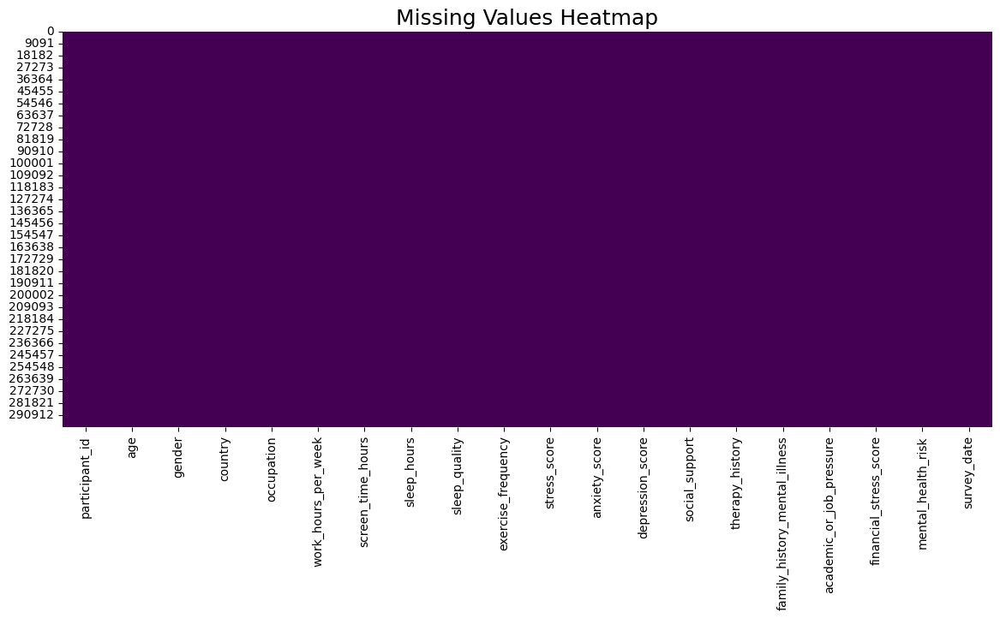

In [14]:
plt.figure(figsize=(14,6))

sns.heatmap(
    df.isnull(),
    cbar=False,
    cmap='viridis'
)

plt.title("Missing Values Heatmap", fontsize=18)
plt.show()

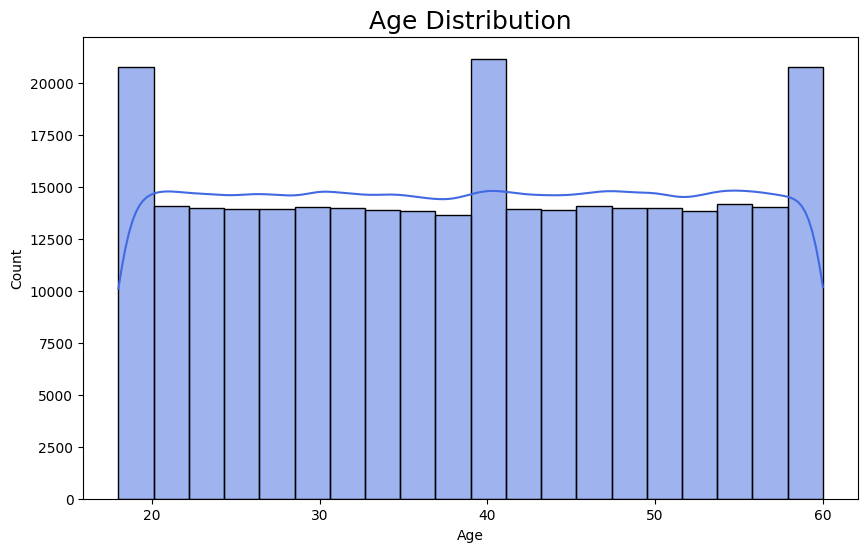

In [15]:
plt.figure(figsize=(10,6))

sns.histplot(
    data=df,
    x='age',
    bins=20,
    kde=True,
    color='royalblue'
)

plt.title("Age Distribution", fontsize=18)
plt.xlabel("Age")
plt.ylabel("Count")

plt.show()

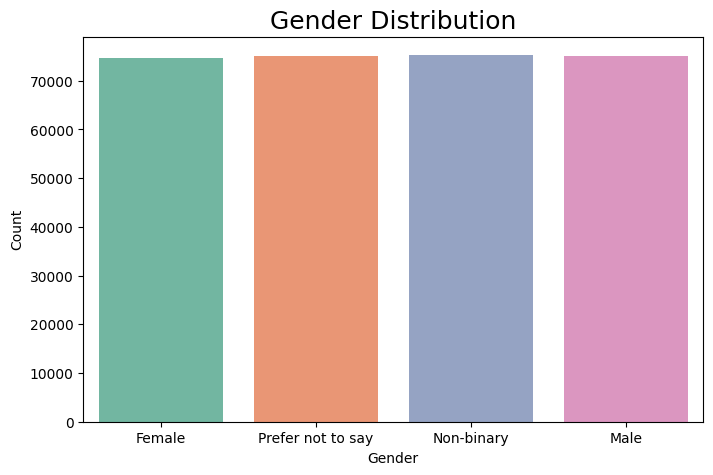

In [16]:
plt.figure(figsize=(8,5))

sns.countplot(
    data=df,
    x='gender',
    palette='Set2'
)

plt.title("Gender Distribution", fontsize=18)
plt.xlabel("Gender")
plt.ylabel("Count")

plt.show()


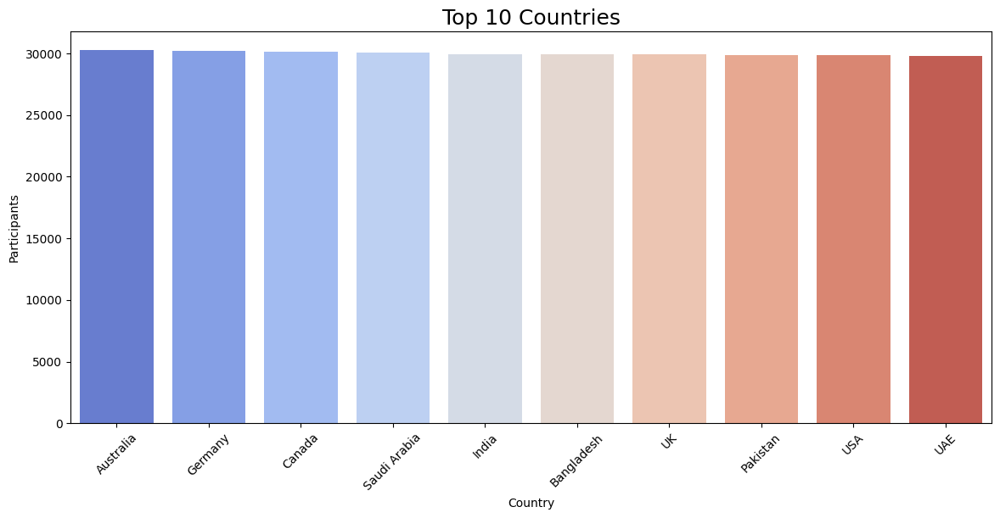

In [17]:
plt.figure(figsize=(14,6))

country_counts = df['country'].value_counts().head(10)

sns.barplot(
    x=country_counts.index,
    y=country_counts.values,
    palette='coolwarm'
)

plt.title("Top 10 Countries", fontsize=18)
plt.xlabel("Country")
plt.ylabel("Participants")

plt.xticks(rotation=45)

plt.show()

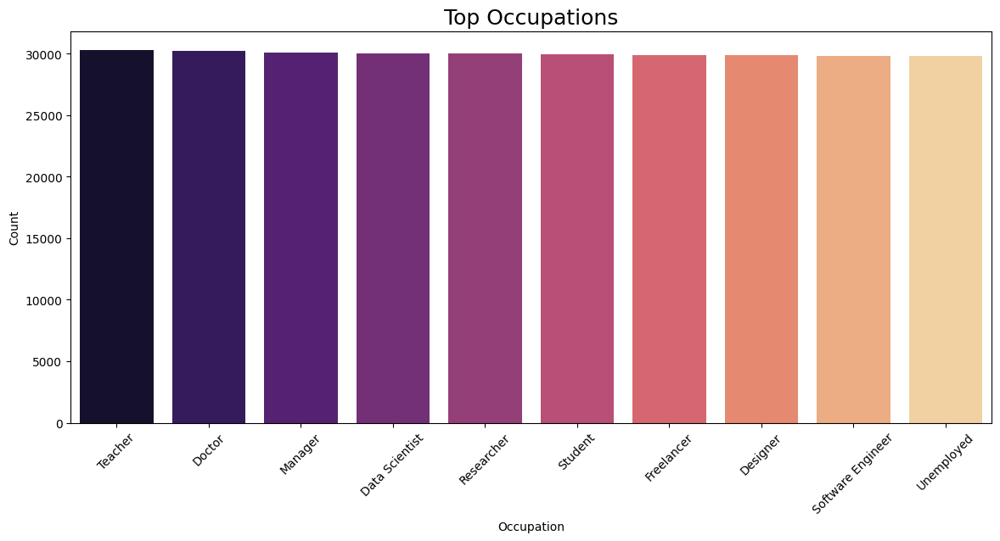

In [18]:
plt.figure(figsize=(14,6))

occupation_counts = df['occupation'].value_counts().head(10)

sns.barplot(
    x=occupation_counts.index,
    y=occupation_counts.values,
    palette='magma'
)

plt.title("Top Occupations", fontsize=18)
plt.xlabel("Occupation")
plt.ylabel("Count")

plt.xticks(rotation=45)

plt.show()

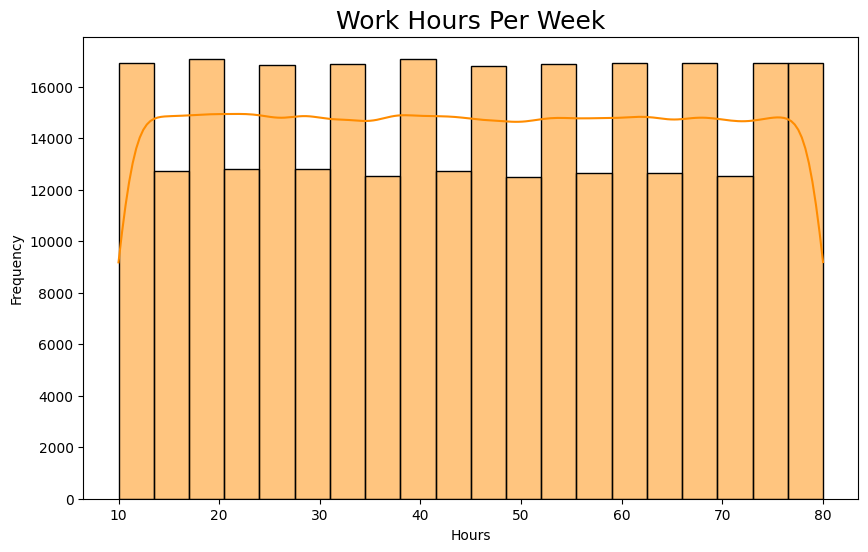

In [19]:
plt.figure(figsize=(10,6))

sns.histplot(
    df['work_hours_per_week'],
    bins=20,
    kde=True,
    color='darkorange'
)

plt.title("Work Hours Per Week", fontsize=18)
plt.xlabel("Hours")
plt.ylabel("Frequency")

plt.show()

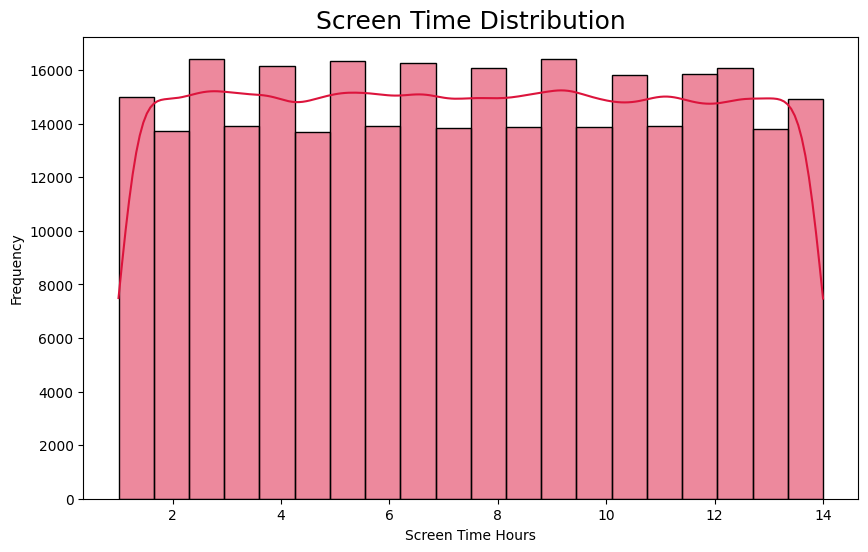

In [20]:
plt.figure(figsize=(10,6))

sns.histplot(
    df['screen_time_hours'],
    bins=20,
    kde=True,
    color='crimson'
)

plt.title("Screen Time Distribution", fontsize=18)
plt.xlabel("Screen Time Hours")
plt.ylabel("Frequency")

plt.show()


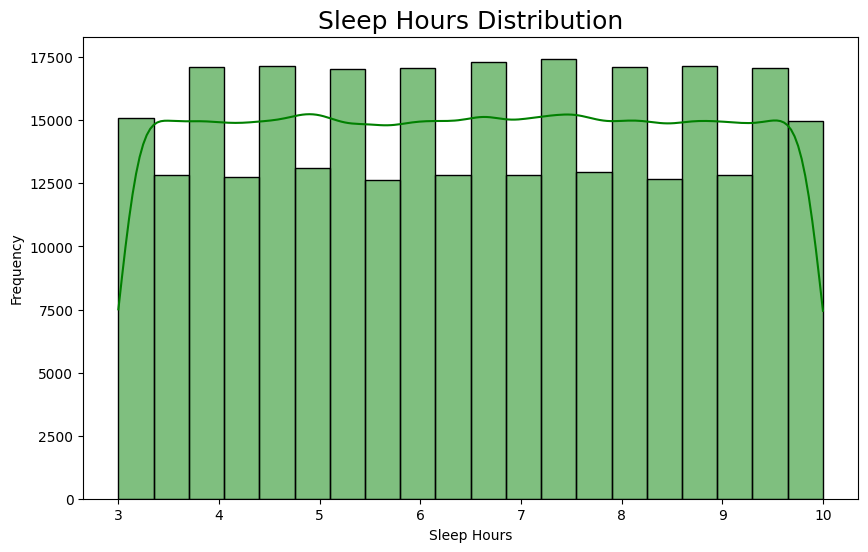

In [21]:
plt.figure(figsize=(10,6))

sns.histplot(
    df['sleep_hours'],
    bins=20,
    kde=True,
    color='green'
)

plt.title("Sleep Hours Distribution", fontsize=18)
plt.xlabel("Sleep Hours")
plt.ylabel("Frequency")

plt.show()


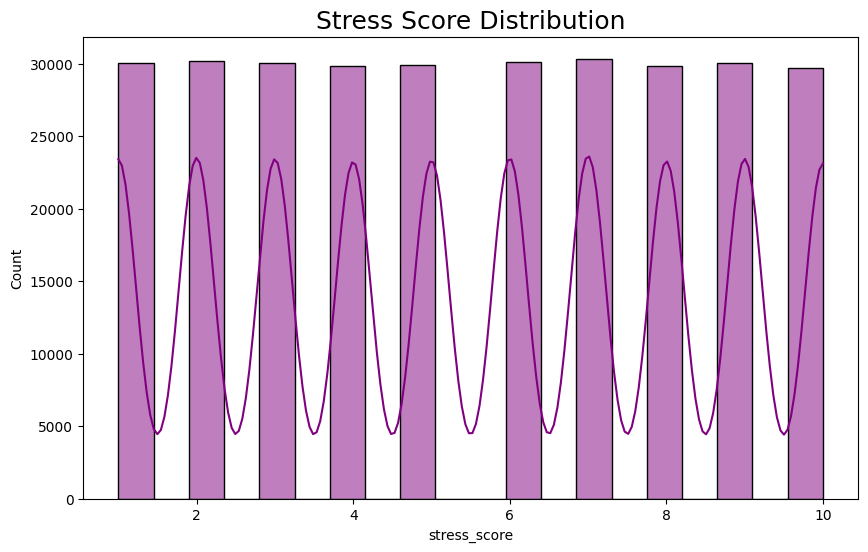

In [22]:
plt.figure(figsize=(10,6))

sns.histplot(
    df['stress_score'],
    bins=20,
    kde=True,
    color='purple'
)

plt.title("Stress Score Distribution", fontsize=18)

plt.show()

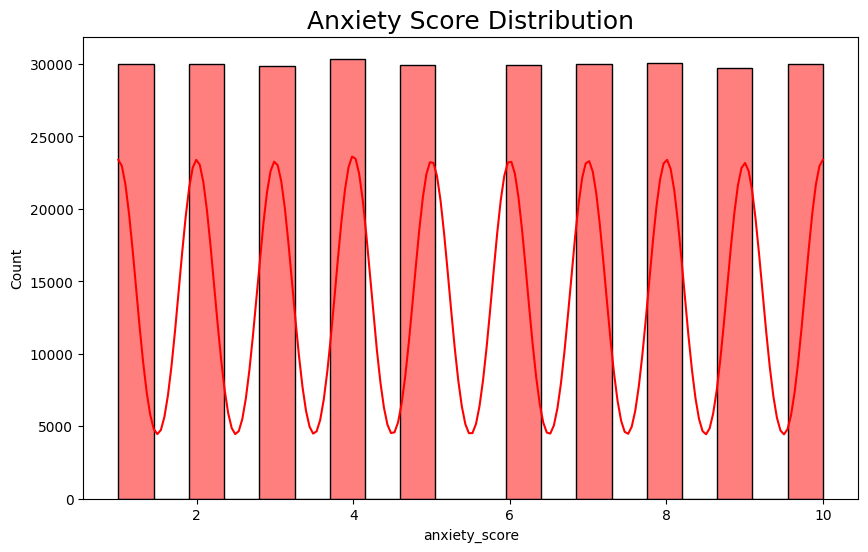

In [23]:
plt.figure(figsize=(10,6))

sns.histplot(
    df['anxiety_score'],
    bins=20,
    kde=True,
    color='red'
)

plt.title("Anxiety Score Distribution", fontsize=18)

plt.show()


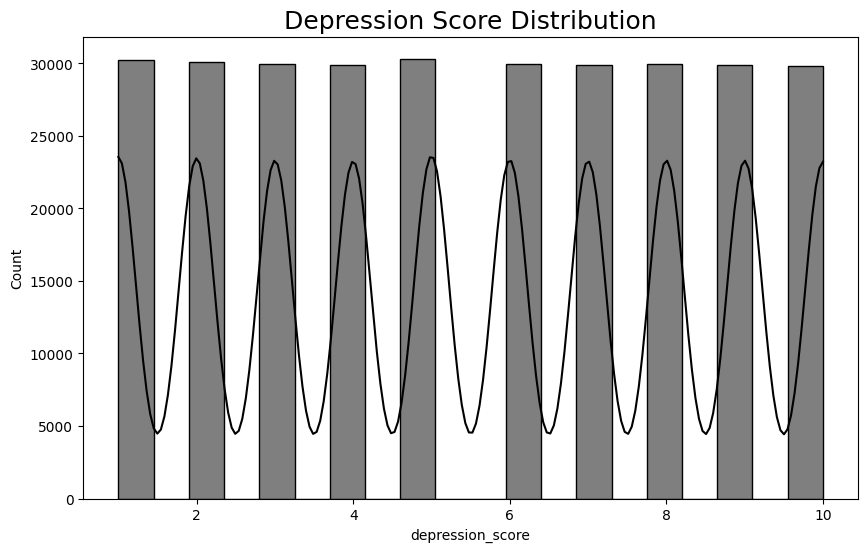

In [24]:
plt.figure(figsize=(10,6))

sns.histplot(
    df['depression_score'],
    bins=20,
    kde=True,
    color='black'
)

plt.title("Depression Score Distribution", fontsize=18)

plt.show()

# =============

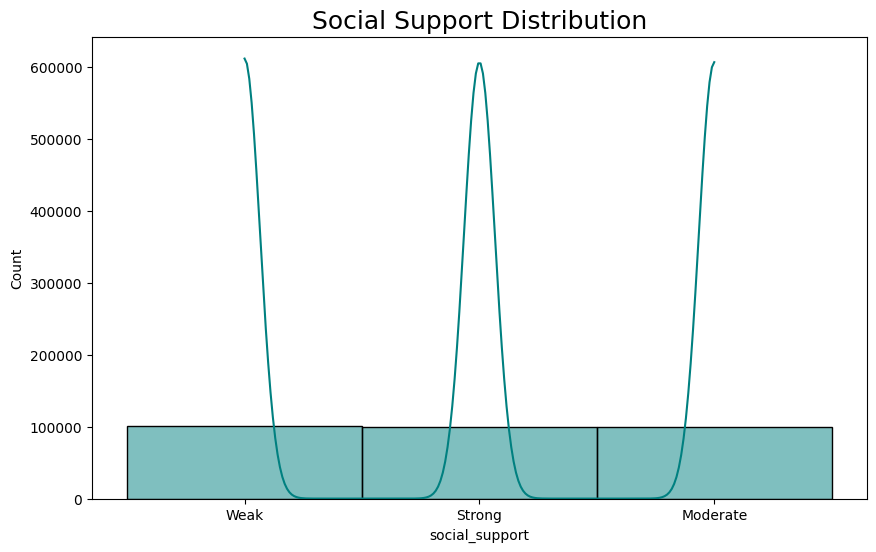

In [25]:
plt.figure(figsize=(10,6))

sns.histplot(
    df['social_support'],
    bins=20,
    kde=True,
    color='teal'
)

plt.title("Social Support Distribution", fontsize=18)

plt.show()

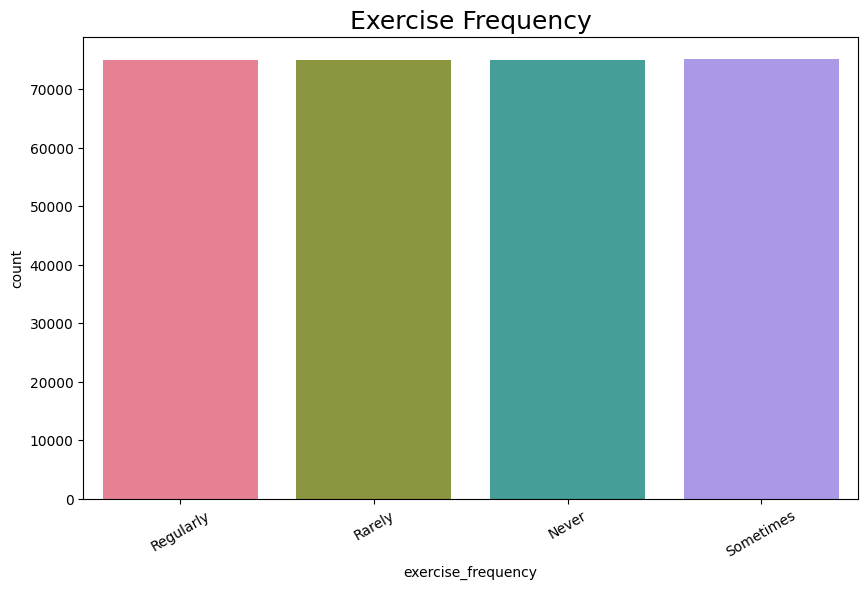

In [26]:
plt.figure(figsize=(10,6))

sns.countplot(
    data=df,
    x='exercise_frequency',
    palette='husl'
)

plt.title("Exercise Frequency", fontsize=18)

plt.xticks(rotation=30)

plt.show()

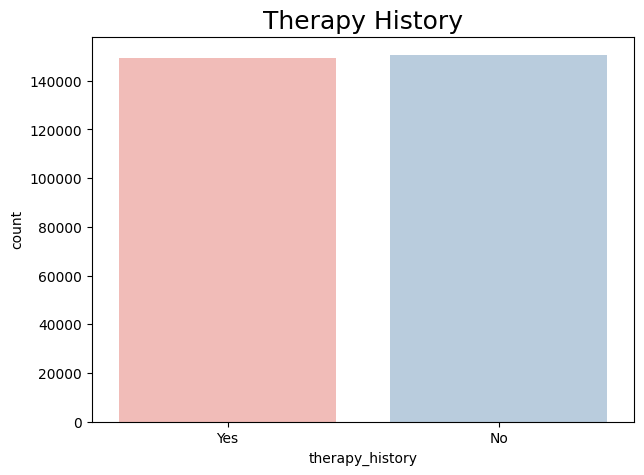

In [27]:
plt.figure(figsize=(7,5))

sns.countplot(
    data=df,
    x='therapy_history',
    palette='Pastel1'
)

plt.title("Therapy History", fontsize=18)

plt.show()

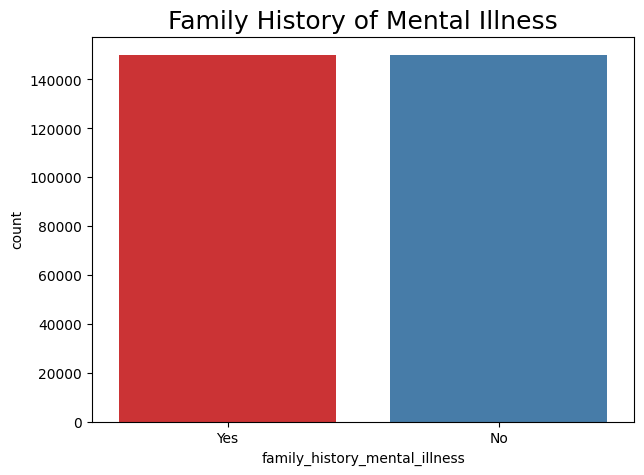

In [28]:
plt.figure(figsize=(7,5))

sns.countplot(
    data=df,
    x='family_history_mental_illness',
    palette='Set1'
)

plt.title("Family History of Mental Illness", fontsize=18)

plt.show()


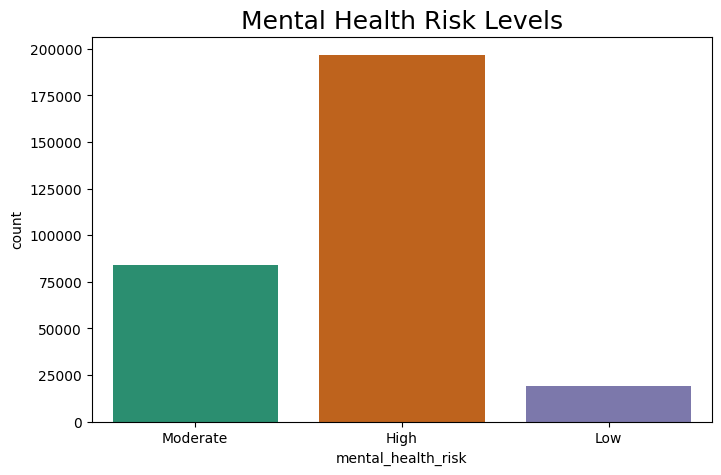

In [29]:
plt.figure(figsize=(8,5))

sns.countplot(
    data=df,
    x='mental_health_risk',
    palette='Dark2'
)

plt.title("Mental Health Risk Levels", fontsize=18)

plt.show()

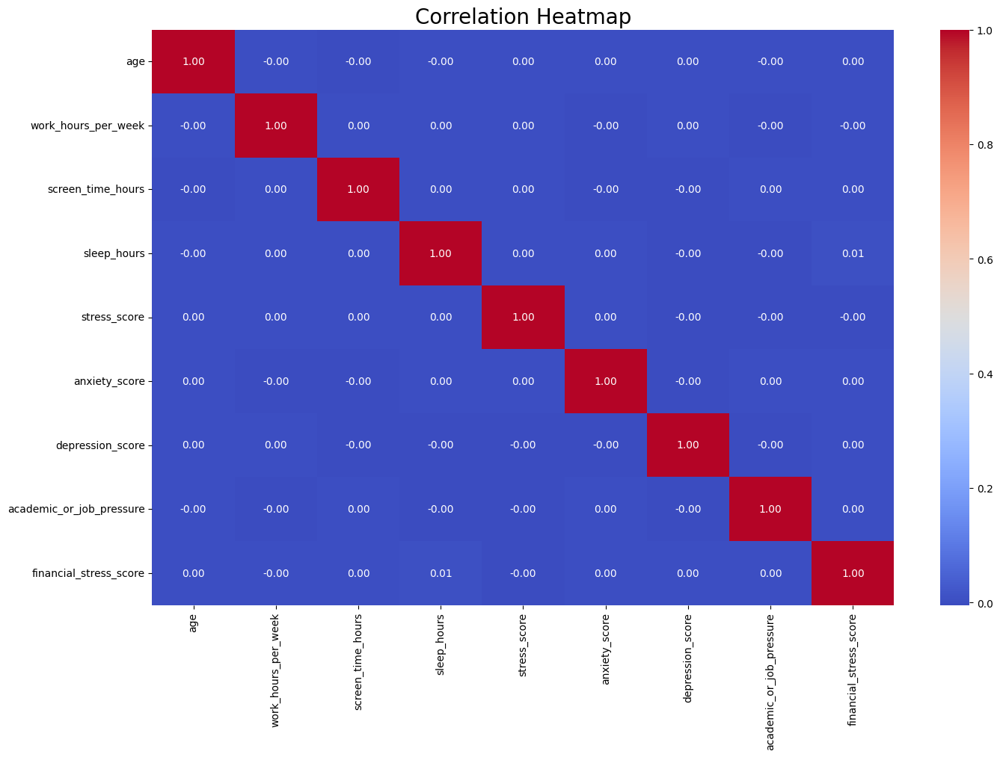

In [30]:
numeric_df = df.select_dtypes(include=np.number)

plt.figure(figsize=(16,10))

sns.heatmap(
    numeric_df.corr(),
    annot=True,
    cmap='coolwarm',
    fmt='.2f'
)

plt.title("Correlation Heatmap", fontsize=20)

plt.show()


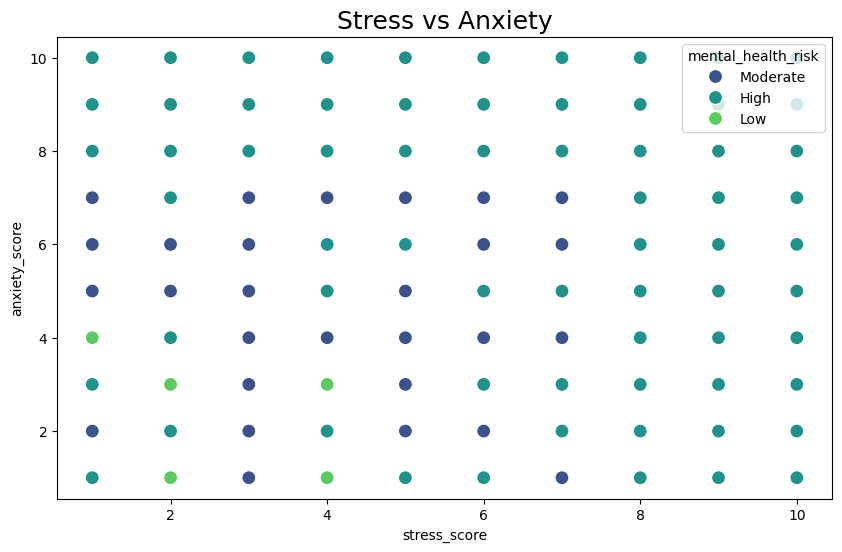

In [31]:
plt.figure(figsize=(10,6))

sns.scatterplot(
    data=df,
    x='stress_score',
    y='anxiety_score',
    hue='mental_health_risk',
    palette='viridis',
    s=100
)

plt.title("Stress vs Anxiety", fontsize=18)

plt.show()

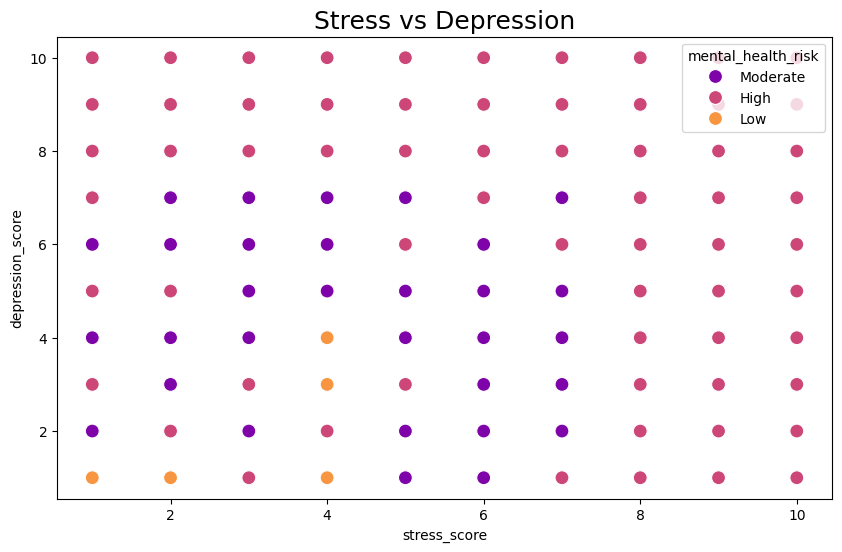

In [32]:
plt.figure(figsize=(10,6))

sns.scatterplot(
    data=df,
    x='stress_score',
    y='depression_score',
    hue='mental_health_risk',
    palette='plasma',
    s=100
)

plt.title("Stress vs Depression", fontsize=18)

plt.show()

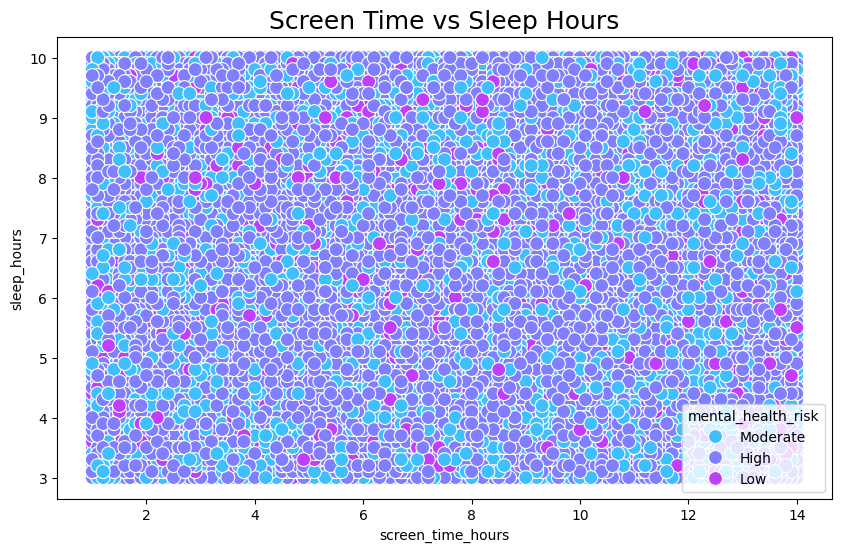

In [33]:
plt.figure(figsize=(10,6))

sns.scatterplot(
    data=df,
    x='screen_time_hours',
    y='sleep_hours',
    hue='mental_health_risk',
    palette='cool',
    s=100
)

plt.title("Screen Time vs Sleep Hours", fontsize=18)

plt.show()


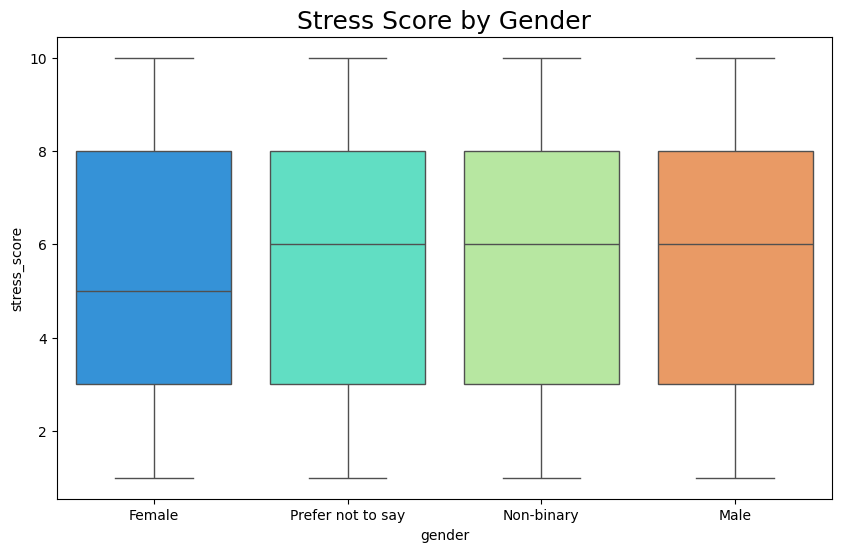

In [34]:
plt.figure(figsize=(10,6))

sns.boxplot(
    data=df,
    x='gender',
    y='stress_score',
    palette='rainbow'
)

plt.title("Stress Score by Gender", fontsize=18)

plt.show()

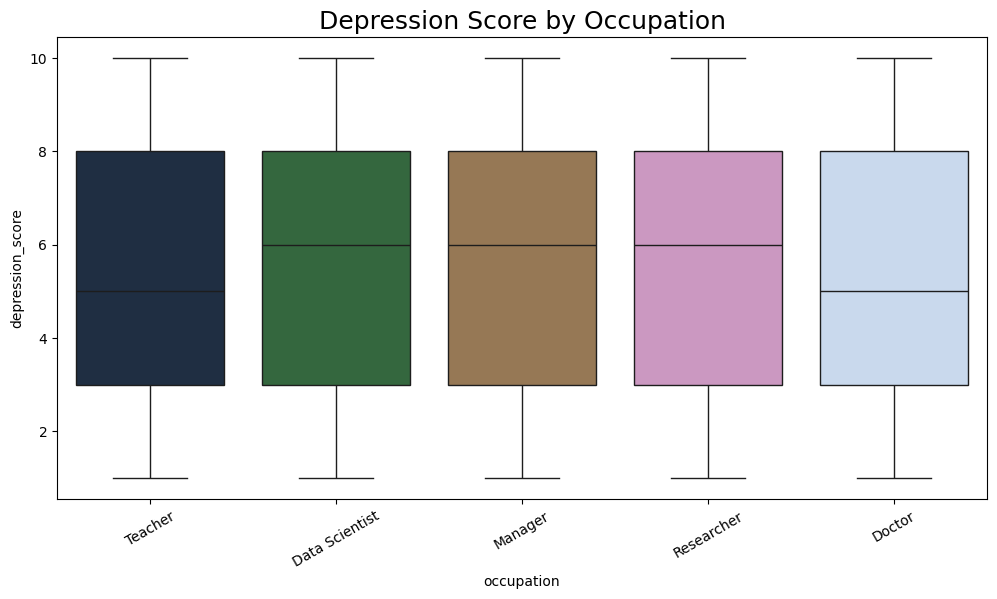

In [35]:
top_occupations = df['occupation'].value_counts().head(5).index

filtered_df = df[df['occupation'].isin(top_occupations)]

plt.figure(figsize=(12,6))

sns.boxplot(
    data=filtered_df,
    x='occupation',
    y='depression_score',
    palette='cubehelix'
)

plt.title("Depression Score by Occupation", fontsize=18)

plt.xticks(rotation=30)

plt.show()

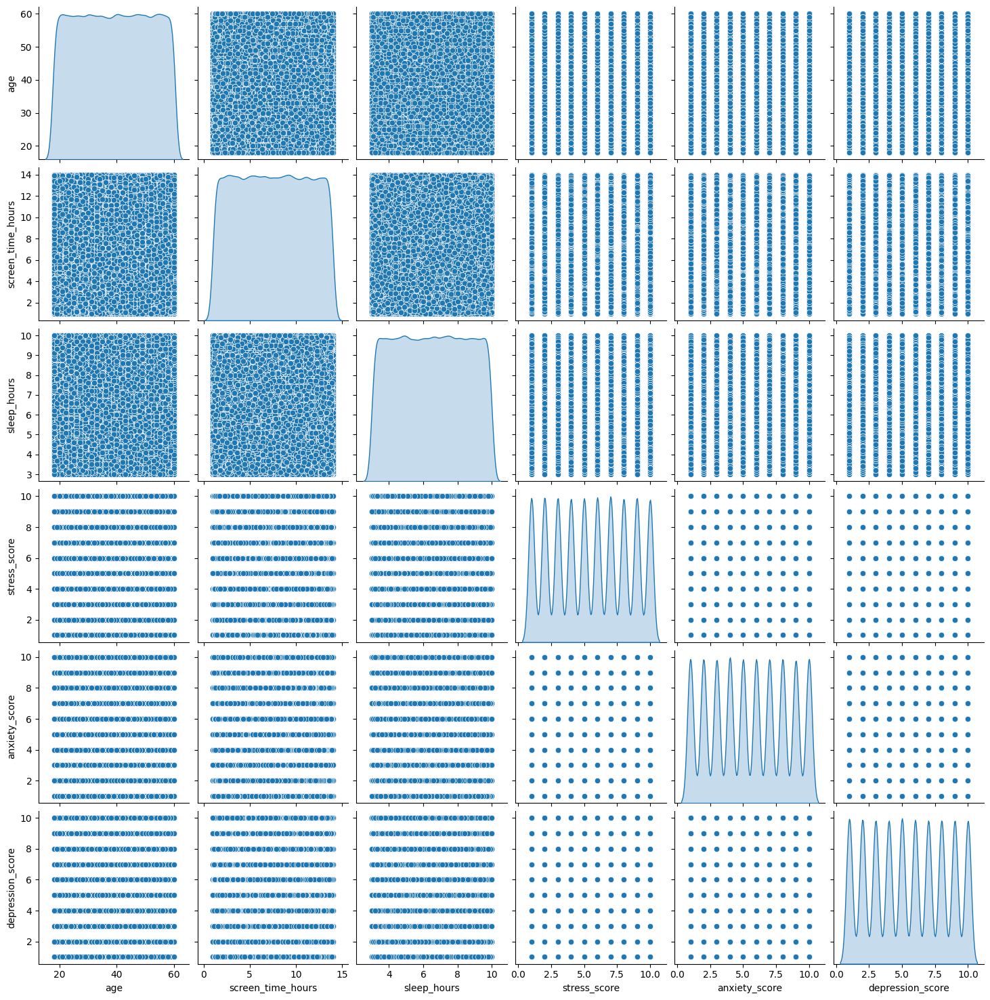

In [36]:
selected_columns = [
    'age',
    'screen_time_hours',
    'sleep_hours',
    'stress_score',
    'anxiety_score',
    'depression_score'
]

sns.pairplot(
    df[selected_columns],
    diag_kind='kde'
)

plt.show()


In [37]:
fig = px.scatter(
    df,
    x='stress_score',
    y='depression_score',
    color='mental_health_risk',
    size='screen_time_hours',
    hover_data=[
        'occupation',
        'country',
        'sleep_hours'
    ],
    color_discrete_sequence=px.colors.qualitative.Bold,
    title='Stress vs Depression Interactive Plot'
)

fig.show()


In [38]:
fig = px.box(
    df,
    x='mental_health_risk',
    y='anxiety_score',
    color='mental_health_risk',
    color_discrete_sequence=px.colors.qualitative.Set1,
    title='Anxiety Score by Mental Health Risk'
)

fig.show()


In [39]:
corr_matrix = numeric_df.corr()

fig = px.imshow(
    corr_matrix,
    text_auto=True,
    color_continuous_scale='RdBu_r',
    title='Interactive Correlation Heatmap'
)

fig.show()

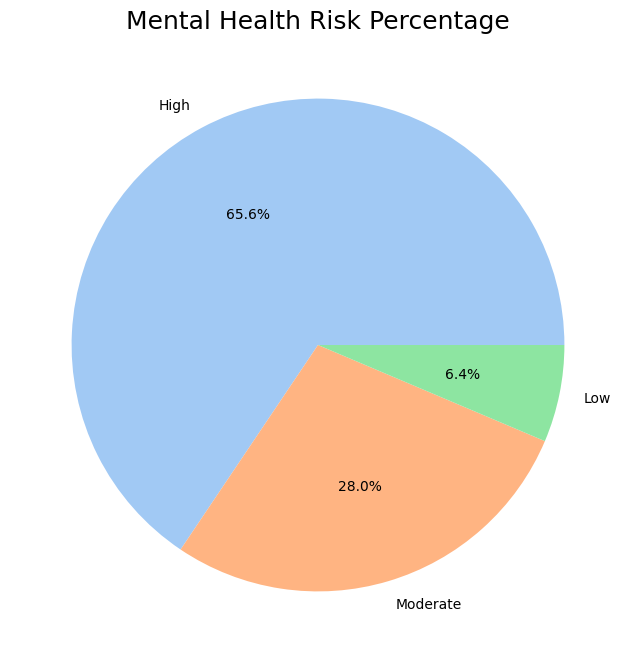

In [40]:
risk_counts = df['mental_health_risk'].value_counts()

plt.figure(figsize=(8,8))

plt.pie(
    risk_counts.values,
    labels=risk_counts.index,
    autopct='%1.1f%%',
    colors=sns.color_palette('pastel')
)

plt.title("Mental Health Risk Percentage", fontsize=18)

plt.show()

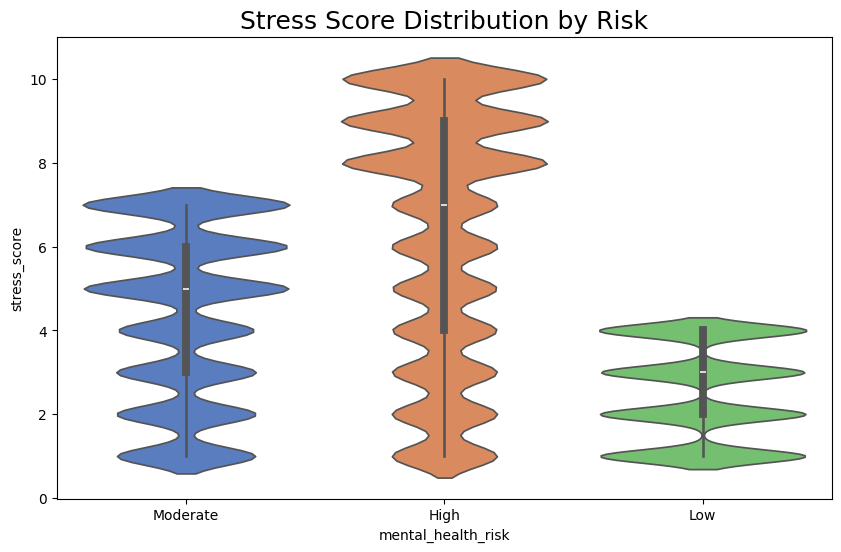

In [41]:
plt.figure(figsize=(10,6))

sns.violinplot(
    data=df,
    x='mental_health_risk',
    y='stress_score',
    palette='muted'
)

plt.title("Stress Score Distribution by Risk", fontsize=18)

plt.show()

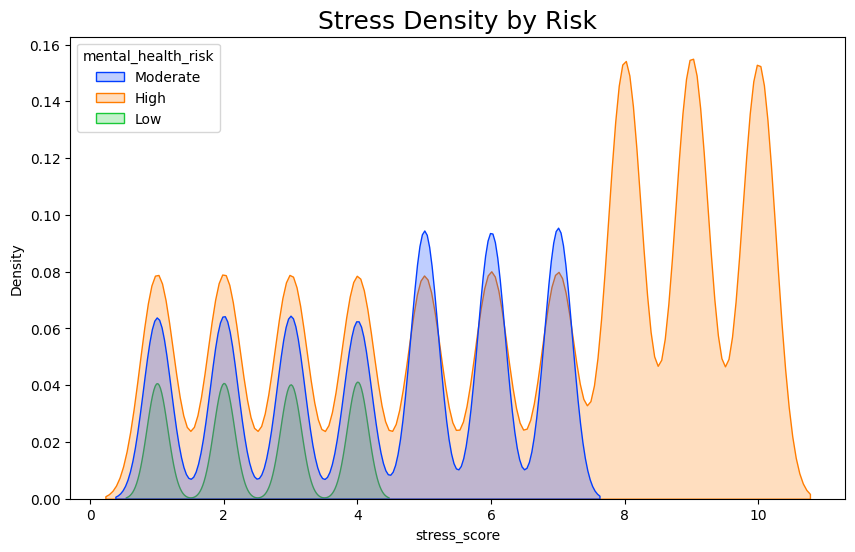

In [42]:
plt.figure(figsize=(10,6))

sns.kdeplot(
    data=df,
    x='stress_score',
    hue='mental_health_risk',
    fill=True,
    palette='bright'
)

plt.title("Stress Density by Risk", fontsize=18)

plt.show()


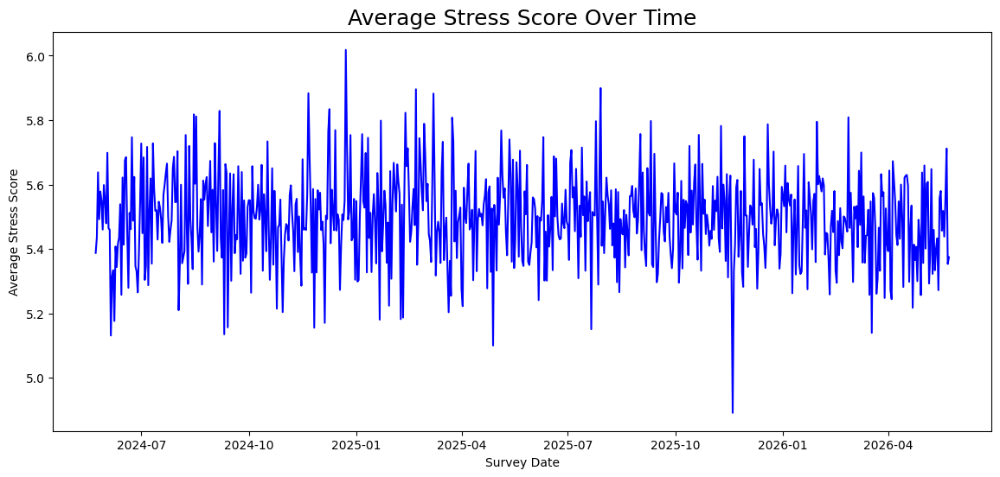

In [43]:
df['survey_date'] = pd.to_datetime(df['survey_date'])

# Average stress score by date
date_stress = df.groupby('survey_date')['stress_score'].mean().reset_index()

plt.figure(figsize=(14,6))

sns.lineplot(
    data=date_stress,
    x='survey_date',
    y='stress_score',
    color='blue'
)

plt.title("Average Stress Score Over Time", fontsize=18)

plt.xlabel("Survey Date")
plt.ylabel("Average Stress Score")

plt.show()

## Feature engineering

Dataset Shape: (300000, 20)

Categorical Columns:
['gender', 'country', 'occupation', 'sleep_quality', 'exercise_frequency', 'social_support', 'therapy_history', 'family_history_mental_illness']

Numerical Columns:
['age', 'work_hours_per_week', 'screen_time_hours', 'sleep_hours', 'stress_score', 'anxiety_score', 'depression_score', 'academic_or_job_pressure', 'financial_stress_score']

Processed Train Shape: (240000, 48)
Processed Test Shape : (60000, 48)


Logistic Regression

Accuracy: 0.7934

Classification Report:

              precision    recall  f1-score   support

           0       0.84      0.90      0.87     39350
           1       0.78      0.68      0.73      3827
           2       0.65      0.56      0.60     16823

    accuracy                           0.79     60000
   macro avg       0.76      0.72      0.73     60000
weighted avg       0.79      0.79      0.79     60000



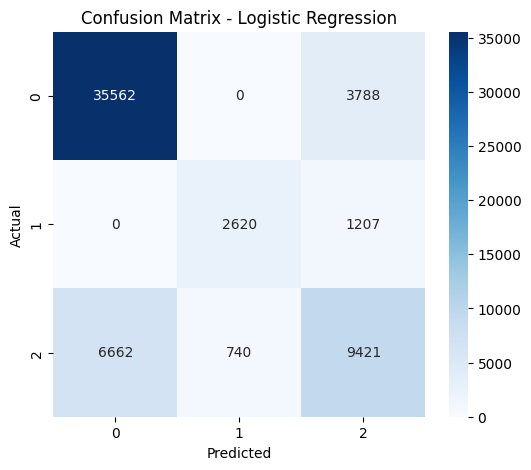



Decision Tree

Accuracy: 1.0000

Classification Report:

              precision    recall  f1-score   support

           0       1.00      1.00      1.00     39350
           1       1.00      1.00      1.00      3827
           2       1.00      1.00      1.00     16823

    accuracy                           1.00     60000
   macro avg       1.00      1.00      1.00     60000
weighted avg       1.00      1.00      1.00     60000



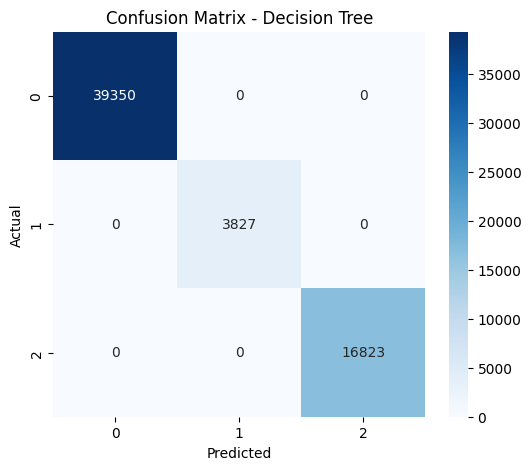



Random Forest

Accuracy: 1.0000

Classification Report:

              precision    recall  f1-score   support

           0       1.00      1.00      1.00     39350
           1       1.00      1.00      1.00      3827
           2       1.00      1.00      1.00     16823

    accuracy                           1.00     60000
   macro avg       1.00      1.00      1.00     60000
weighted avg       1.00      1.00      1.00     60000



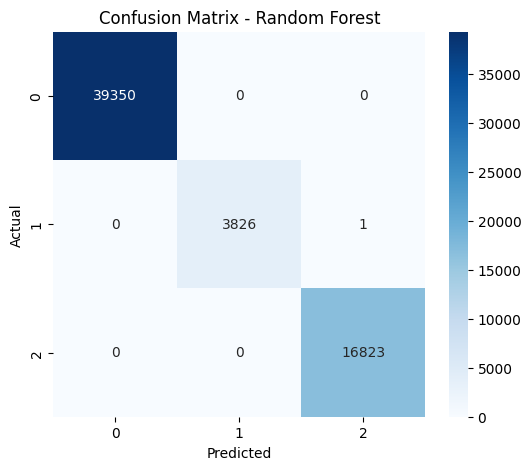



KNN

Accuracy: 0.8237

Classification Report:

              precision    recall  f1-score   support

           0       0.88      0.93      0.90     39350
           1       0.70      0.56      0.62      3827
           2       0.70      0.64      0.67     16823

    accuracy                           0.82     60000
   macro avg       0.76      0.71      0.73     60000
weighted avg       0.82      0.82      0.82     60000



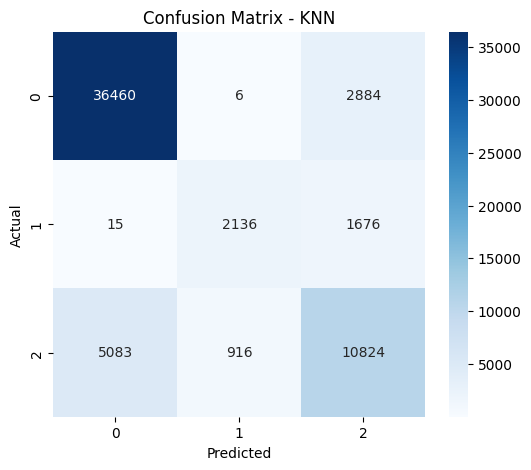



Naive Bayes

Accuracy: 0.8773

Classification Report:

              precision    recall  f1-score   support

           0       0.86      1.00      0.93     39350
           1       1.00      0.70      0.82      3827
           2       0.90      0.63      0.74     16823

    accuracy                           0.88     60000
   macro avg       0.92      0.78      0.83     60000
weighted avg       0.88      0.88      0.87     60000



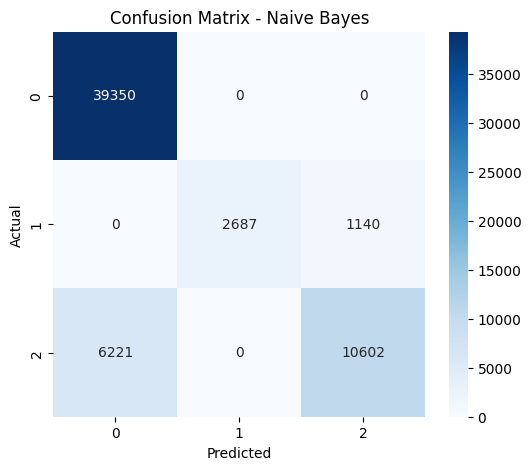



MODEL COMPARISON
                 Model  Accuracy
1        Decision Tree  1.000000
2        Random Forest  0.999983
4          Naive Bayes  0.877317
3                  KNN  0.823667
0  Logistic Regression  0.793383


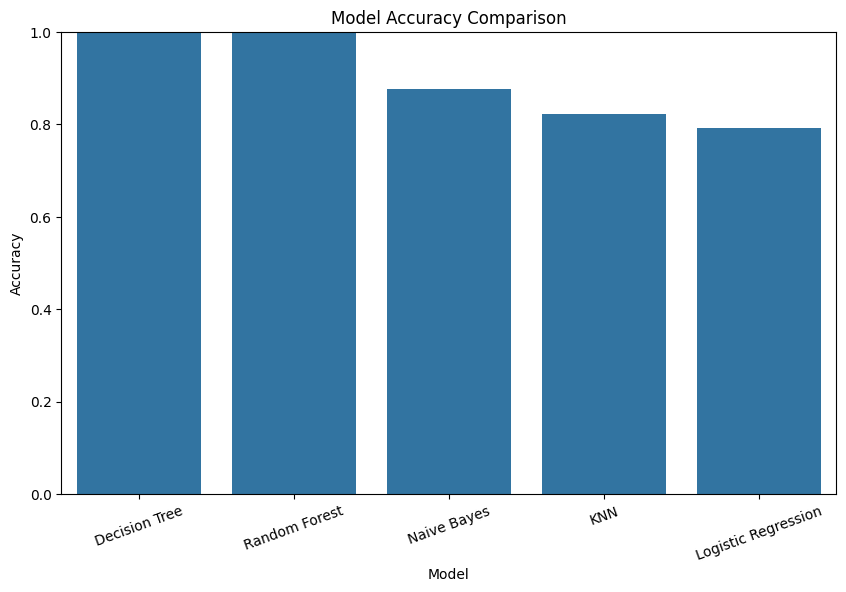



BEST MODEL
Decision Tree

Top 15 Important Features

                              Feature  Importance
6               num__depression_score    0.277925
4                   num__stress_score    0.276558
5                  num__anxiety_score    0.275458
2              num__screen_time_hours    0.018334
3                    num__sleep_hours    0.017275
1            num__work_hours_per_week    0.017241
0                            num__age    0.016295
7       num__academic_or_job_pressure    0.011221
8         num__financial_stress_score    0.010993
40  cat__exercise_frequency_Sometimes    0.002588
44            cat__therapy_history_No    0.002566
42         cat__social_support_Strong    0.002559
43           cat__social_support_Weak    0.002549
45           cat__therapy_history_Yes    0.002527
41       cat__social_support_Moderate    0.002522


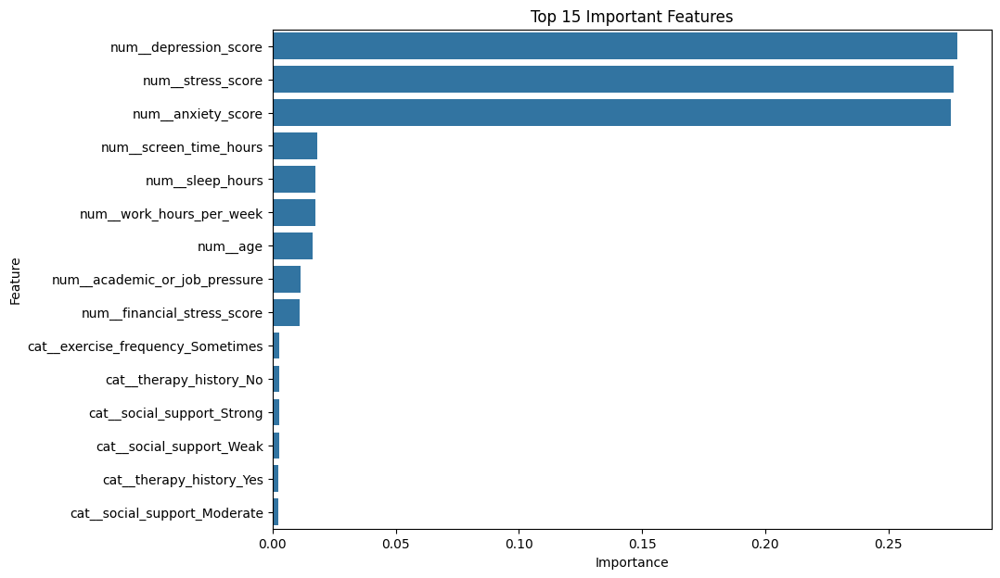


Sample Prediction:
[0]


In [44]:
from sklearn.model_selection import train_test_split

from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline

from sklearn.impute import SimpleImputer

from sklearn.preprocessing import (
    OneHotEncoder,
    StandardScaler,
    LabelEncoder
)

from sklearn.metrics import (
    accuracy_score,
    classification_report,
    confusion_matrix
)

from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.naive_bayes import GaussianNB

# ==========================================================
# LOAD DATA
# ==========================================================

# df = pd.read_csv("mental_health.csv")

print("Dataset Shape:", df.shape)

# ==========================================================
# DROP USELESS COLUMNS
# ==========================================================

df = df.drop(
    columns=[
        "participant_id",
        "survey_date"
    ],
    errors="ignore"
)

# ==========================================================
# TARGET COLUMN
# ==========================================================

target_column = "mental_health_risk"

# ==========================================================
# FEATURES & TARGET
# ==========================================================

X = df.drop(columns=[target_column])

y = df[target_column]

# ==========================================================
# ENCODE TARGET IF CATEGORICAL
# ==========================================================

if y.dtype == "object":

    label_encoder = LabelEncoder()

    y = label_encoder.fit_transform(y)

# ==========================================================
# COLUMN TYPES
# ==========================================================

categorical_columns = X.select_dtypes(
    include=["object"]
).columns.tolist()

numerical_columns = X.select_dtypes(
    exclude=["object"]
).columns.tolist()

print("\nCategorical Columns:")
print(categorical_columns)

print("\nNumerical Columns:")
print(numerical_columns)

# ==========================================================
# PREPROCESSING
# ==========================================================

numeric_transformer = Pipeline([
    ("imputer", SimpleImputer(strategy="median")),
    ("scaler", StandardScaler())
])

categorical_transformer = Pipeline([
    ("imputer", SimpleImputer(strategy="most_frequent")),
    ("encoder", OneHotEncoder(handle_unknown="ignore"))
])

preprocessor = ColumnTransformer([
    ("num", numeric_transformer, numerical_columns),
    ("cat", categorical_transformer, categorical_columns)
])

# ==========================================================
# TRAIN TEST SPLIT
# ==========================================================

X_train, X_test, y_train, y_test = train_test_split(
    X,
    y,
    test_size=0.20,
    random_state=42,
    stratify=y
)

# ==========================================================
# PREPROCESS DATA
# ==========================================================

X_train_processed = preprocessor.fit_transform(X_train)
X_test_processed = preprocessor.transform(X_test)

# Convert sparse matrix to dense if needed

if hasattr(X_train_processed, "toarray"):
    X_train_processed = X_train_processed.toarray()

if hasattr(X_test_processed, "toarray"):
    X_test_processed = X_test_processed.toarray()

print("\nProcessed Train Shape:", X_train_processed.shape)
print("Processed Test Shape :", X_test_processed.shape)

# ==========================================================
# MODELS
# ==========================================================

models = {

    "Logistic Regression":
    LogisticRegression(max_iter=1000),

    "Decision Tree":
    DecisionTreeClassifier(random_state=42),

    "Random Forest":
    RandomForestClassifier(
        n_estimators=100,
        random_state=42
    ),

    "KNN":
    KNeighborsClassifier(n_neighbors=5),

    "Naive Bayes":
    GaussianNB()
}

# ==========================================================
# TRAIN & EVALUATE
# ==========================================================

accuracy_results = {}

for name, model in models.items():

    print("\n")
    print("="*60)
    print(name)
    print("="*60)

    # Train

    model.fit(
        X_train_processed,
        y_train
    )

    # Predict

    y_pred = model.predict(
        X_test_processed
    )

    # Accuracy

    accuracy = accuracy_score(
        y_test,
        y_pred
    )

    accuracy_results[name] = accuracy

    print(f"\nAccuracy: {accuracy:.4f}")

    # Classification Report

    print("\nClassification Report:\n")

    print(
        classification_report(
            y_test,
            y_pred
        )
    )

    # Confusion Matrix

    cm = confusion_matrix(
        y_test,
        y_pred
    )

    plt.figure(figsize=(6,5))

    sns.heatmap(
        cm,
        annot=True,
        fmt='d',
        cmap='Blues'
    )

    plt.title(
        f'Confusion Matrix - {name}'
    )

    plt.xlabel("Predicted")

    plt.ylabel("Actual")

    plt.show()

# ==========================================================
# ACCURACY COMPARISON
# ==========================================================

accuracy_df = pd.DataFrame({

    "Model": accuracy_results.keys(),
    "Accuracy": accuracy_results.values()

})

accuracy_df = accuracy_df.sort_values(
    by="Accuracy",
    ascending=False
)

print("\n")
print("="*60)
print("MODEL COMPARISON")
print("="*60)

print(accuracy_df)

# ==========================================================
# ACCURACY BAR CHART
# ==========================================================

plt.figure(figsize=(10,6))

sns.barplot(
    data=accuracy_df,
    x="Model",
    y="Accuracy"
)

plt.title("Model Accuracy Comparison")

plt.xticks(rotation=20)

plt.ylim(0,1)

plt.show()

# ==========================================================
# BEST MODEL
# ==========================================================

best_model_name = accuracy_df.iloc[0]["Model"]

print("\n")
print("="*60)
print("BEST MODEL")
print("="*60)

print(best_model_name)

# ==========================================================
# FEATURE IMPORTANCE
# ==========================================================

rf_model = RandomForestClassifier(
    n_estimators=100,
    random_state=42
)

rf_model.fit(
    X_train_processed,
    y_train
)

feature_importance = rf_model.feature_importances_

feature_names = preprocessor.get_feature_names_out()

importance_df = pd.DataFrame({

    "Feature": feature_names,
    "Importance": feature_importance

})

importance_df = importance_df.sort_values(
    by="Importance",
    ascending=False
)

print("\nTop 15 Important Features\n")

print(
    importance_df.head(15)
)

# ==========================================================
# FEATURE IMPORTANCE PLOT
# ==========================================================

plt.figure(figsize=(10,7))

sns.barplot(
    data=importance_df.head(15),
    x="Importance",
    y="Feature"
)

plt.title(
    "Top 15 Important Features"
)

plt.show()

# ==========================================================
# SAMPLE PREDICTION
# ==========================================================

sample = X_test.iloc[[0]]

sample_processed = preprocessor.transform(sample)

if hasattr(sample_processed, "toarray"):
    sample_processed = sample_processed.toarray()

prediction = rf_model.predict(
    sample_processed
)

print("\nSample Prediction:")

print(prediction)

## Thank you...pls upvote!!!!!!!!!!!!!